# Tutorial 3: Mouse Olfactory Bulb

## Import Modules

In [1]:
import scanpy as sc
import squidpy as sq
import sys
sys.path.append(r"/home/yqzhou/JUPYTER/MyPackage/Pianno")
import pianno as po
import json
from os.path import join
import matplotlib.pyplot as plt
import matplotlib as mpl

## Data input

In [2]:
# Setting the data and configuration file storage path.
sample_name = "MOB"
config_path = "/home/yqzhou/JUPYTER/Revision/Tutorials/" + sample_name
adata = sc.read(join(config_path, "pianno_adata.h5ad"))

## (Optional) Step1：Automatic hyper-parameter selection

In [3]:
# Specify a known marker gene for each pattern
# Background's marker gene can be set to []
# Allow only one pattern's marker gene to be set to []
Patterndict = dict(RMS = ['Mbp'],
                   GCL = ["Camk2n1"],
                   IPL = ['Pcp4'],
                   ML = ['Gabra1'],
                   OPL = ['Cck'],
                   GL = ['Nrsn1'],
                   ONL = ['Apod'],
                   Background = [])

Configuration path of Pianno: /home/yqzhou/JUPYTER/Revision/Tutorials/MOB
[2024-01-18 00:53:24] Creating experiment, Experiment ID: ftql4xdo
[2024-01-18 00:53:24] Starting web server...
[2024-01-18 00:53:25] Setting up...
[2024-01-18 00:53:25] Web UI URLs: http://127.0.0.1:8080 http://10.10.10.8:8080 http://11.11.11.8:8080
[2024-01-18 01:03:36] Stopping experiment, please wait...
[2024-01-18 01:03:39] Experiment stopped


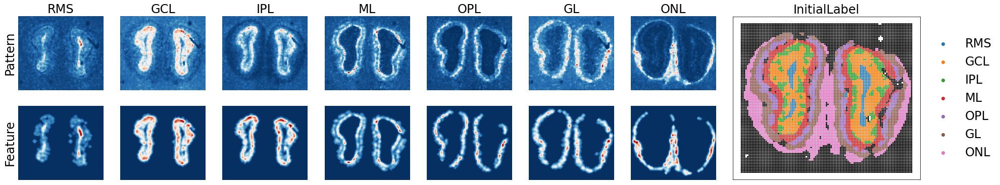

In [4]:
# If the connection fails, try a few more times.
# Open the Web UI URLs to visualize the hyperparameter tuning process.
# The default experiment lasts for a maximum of 10 minutes, 
# which can be modified according to the actual situation.
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=True,
                                  max_experiment_duration='10m')

In [5]:
# Print the optimal parameters saved in the previous step.
with open(join(config_path, "best_params.json"),'r') as f:
    best_params_dict = json.load(f)
for key in best_params_dict:
    best_params = best_params_dict[key]  
best_params

{'n_class': 2,
 'dilation_radius': 2.0,
 'denoise_weight': 0.001,
 'unsharp_radius': 4.0,
 'unsharp_amount': 1.0,
 'gaussian_blur': 4.0}

## (Optional) Step2：Marker Selection

In [6]:
# Take the top 10 DEGs as candidate marker genes to make a proposed patterndict
Patterndict = po.ProposedPatterndict(adata, top_n=10)

RMS
['Id4', 'Mbp', 'Mobp', 'Trim59', 'Sox11', 'Mal', 'Nrep', 'Gpr37', 'Tubb2b', 'Igfbpl1']


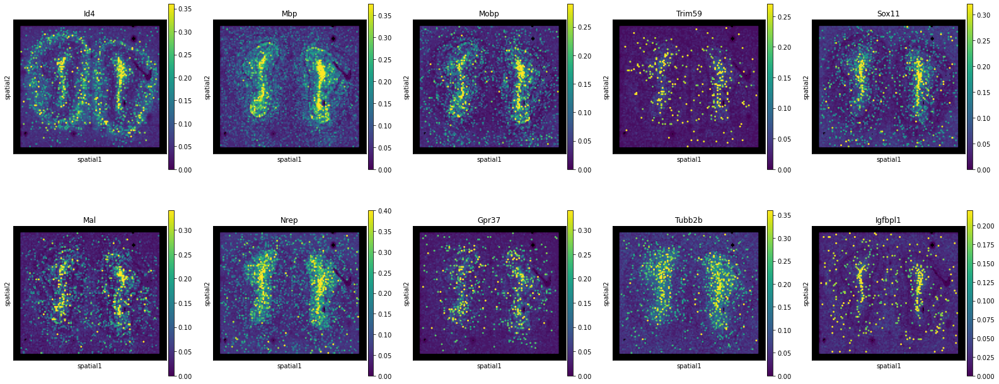

GCL
['Lamp5', 'Kcnh3', 'Map2k1', 'Penk', 'Pbx3', 'Meis2', 'Nrgn', 'Camk2n1', 'Ppp3ca', 'Tshz1']


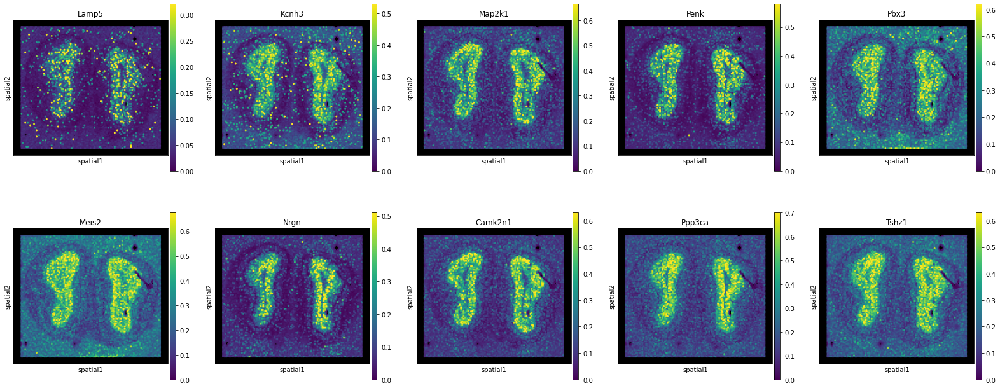

IPL
['Pcp4', 'Igsf5', 'Gng4', 'Gad1', 'Mapk1', 'Gpsm1', 'Iqck', 'Egr4', 'Stxbp6', 'Ncdn']


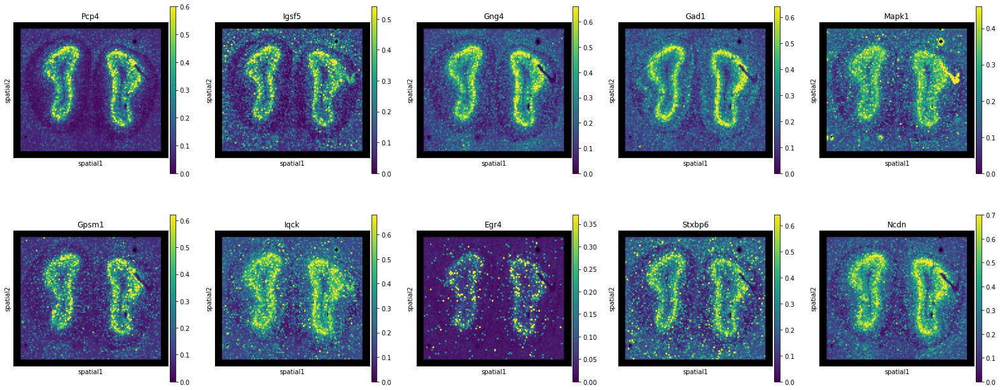

ML
['Stmn2', 'Nptx2', 'Uchl1', 'Shisa3', 'Spp1', 'Slc17a7', 'Crh', 'Gabra1', 'Nefh', 'Lbhd2']


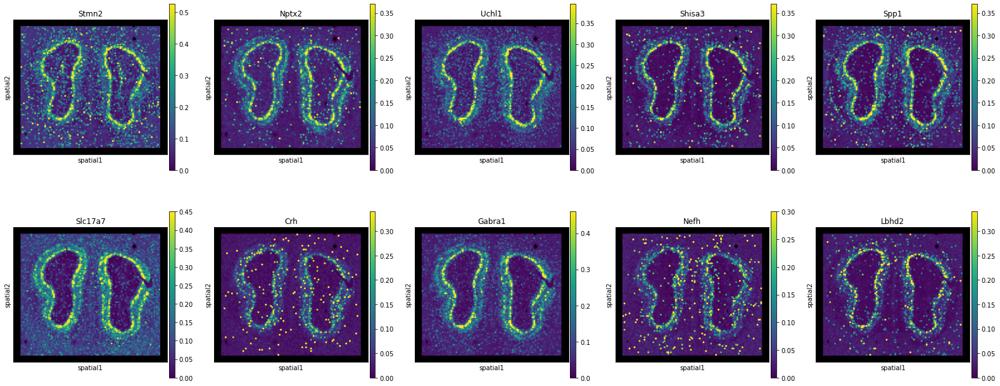

OPL
['Htr5a', 'Kcna2', 'Adcyap1', 'Nptx1', 'Ptprd', 'Bc1', 'Cbln4', 'Barhl2', 'Cck', 'Cdhr1']


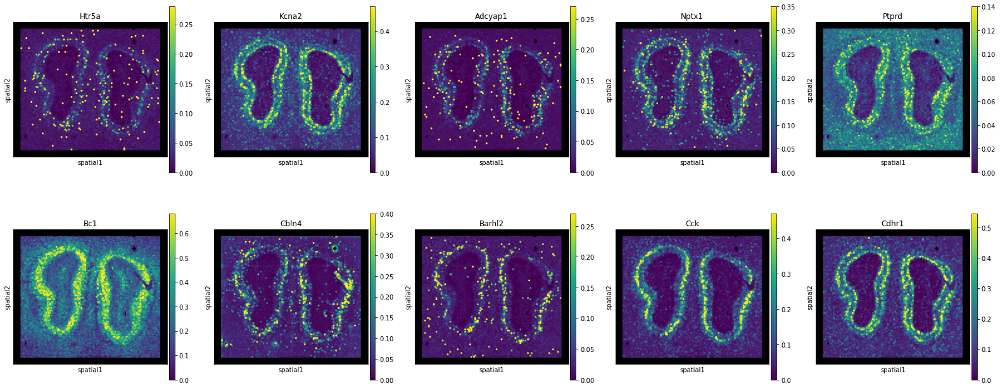

GL
['Grem1', 'Trh', 'Nrsn1', 'Insm1', 'Nxph1', 'AI593442', 'Calb2', 'Th', 'Ly6g6e', 'Nppa']


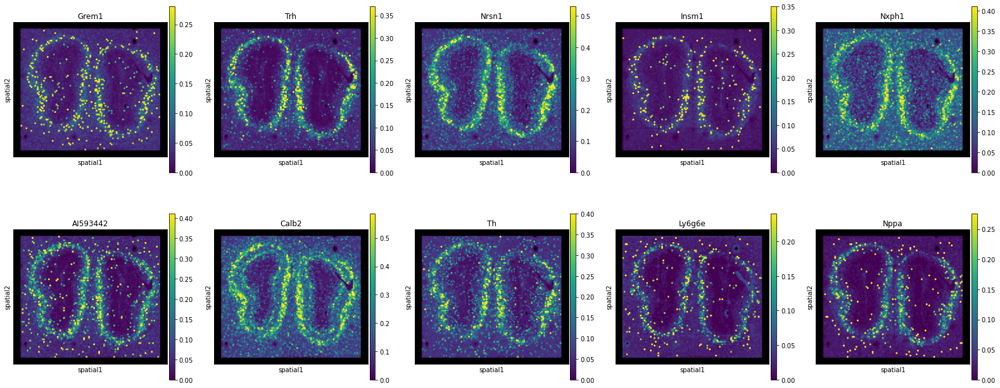

ONL
['Aqp1', 'Vtn', 'Ptn', 'Alx3', 'Col16a1', 'Ifi27l2a', 'Nr2f2', 'Fabp7', 'Foxd3', 'Apod']


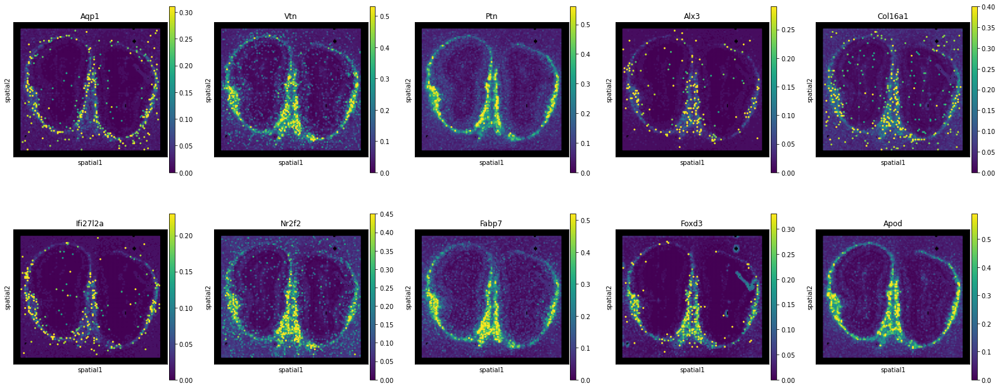

In [7]:
# Visualization of candidate marker genes
for k, v in Patterndict.items():
    print(k)
    print(v)
    with mpl.rc_context({'axes.facecolor':  'black',
                         'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(adata, #cmap='magma',
                      layer='DenoisedX',
                      color=v,
                      ncols=5, size=1.5,
                      spot_size=1,
                      vmin=0, vmax='p99'
                     )

## Step3：Initial Pattern Recognition

In [8]:
# Construct the marker list by selecting 1-3 genes for each pattern 
# from the above candidate marker genes.
Patterndict = dict(RMS = ['Mbp', 'Sox11', 'Nrep'],
                   GCL = ["Penk", "Camk2n1"],
                   IPL = ['Pcp4', 'Gad1', 'Gng4'],
                   ML = ['Gabra1', 'Lbhd2', 'Uchl1'],
                   OPL = ['Cck', 'Cdhr1'],
                   GL = ['Nrsn1', 'Trh', 'AI593442'],
                   ONL = ['Apod', 'Ptn', 'Fabp7'],
                   Background = [])

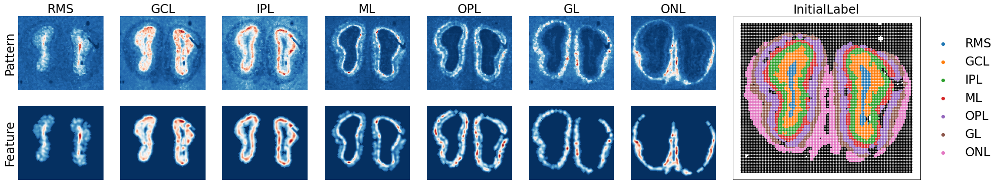

In [9]:
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=False)

## Step4：Annotation Improvement

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


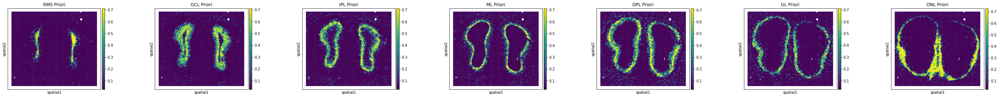

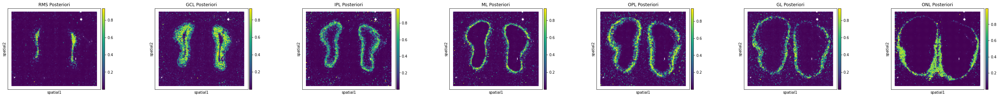

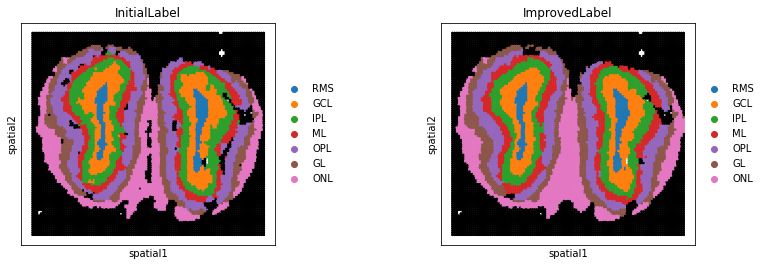

In [10]:
# Set the initial label of certain patterns you want to keep in "keep".
adata = po.AnnotationImprovement(adata,
                                 keep_region = ["RMS", "ML", "GL", "ONL"])